In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
from pathlib import Path
import ast
import matplotlib.dates as mdates
from datetime import timedelta
import random 
random.seed(3)
myFmt = mdates.DateFormatter('%H:%M:%S') 


In [25]:
#RMSE/MAE analysis
def time_reader(fname, core=4):
    lines=open(fname).readlines()
    start_iter=0
    end_iter = 0
    counter=0
    str_dt = lines[0].strip().split(" Sync ")[0].split(".")[0].split(" ")[-1]
    start_iter = datetime.strptime(str_dt, "%H:%M:%S")
    # core_times = [float(i.strip().split(" ")[1]) for i in lines[1*core:1*core+core]]
    core_times=[]
    for i in lines[1*core:1*core+core]:
        num_list = ' '.join(i.strip().split(" ")[2:])
        # print(i)
        # print(num_list)
        num_list = ast.literal_eval(num_list)
        core_times.append(sum(num_list))
    #core_times = [ sum(ast.literal_eval(i.strip().split(" ")[-1])) for i in lines[1*core:1*core+core]]

    str_dt = lines[1*core+core].strip().split(" Sync ")[0].split(".")[0].split(" ")[-1]
    end_iter = datetime.strptime(str_dt, "%H:%M:%S")
    return (core_times, start_iter, end_iter)

def cdf_gen(arr, e=False):
    sorted_arr = sorted(arr)
    y=[]
    for x in range(len(sorted_arr)):
        counter = len(sorted_arr[x+1:]) if e else x+1
        y.append(counter/len(sorted_arr))
    return sorted_arr, y 



list index out of range
/Users/animeshnd/model_splitting/logs/subcluster_exploration/bramble-4-5/tcn_modules_onnx/all_dev/1/speed_chronosbramble-4-5-17_5_4.log
list index out of range
/Users/animeshnd/model_splitting/logs/subcluster_exploration/bramble-4-5/tcn_modules_onnx/all_dev/1/speed_chronosbramble-4-5-17_5_1.log
list index out of range
/Users/animeshnd/model_splitting/logs/subcluster_exploration/bramble-4-5/tcn_modules_onnx/all_dev/1/speed_chronosbramble-4-5-17_5_0.log
list index out of range
/Users/animeshnd/model_splitting/logs/subcluster_exploration/bramble-4-5/tcn_modules_onnx/all_dev/1/speed_chronosbramble-4-5-17_5_2.log
list index out of range
/Users/animeshnd/model_splitting/logs/subcluster_exploration/bramble-4-5/tcn_modules_onnx/all_dev/1/speed_chronosbramble-4-5-17_5_3.log
list index out of range
/Users/animeshnd/model_splitting/logs/subcluster_exploration/bramble-4-5/tcn_modules_onnx/all_dev/1/speed_chronosbramble-4-5-17_2_1.log
list index out of range
/Users/animeshnd

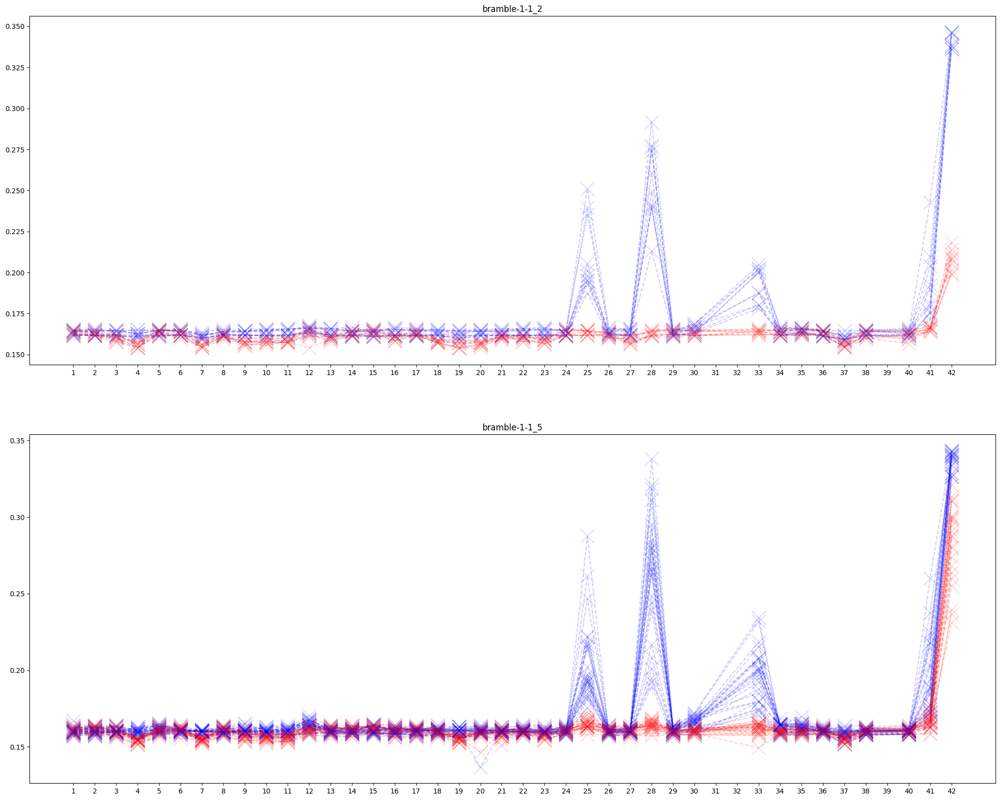

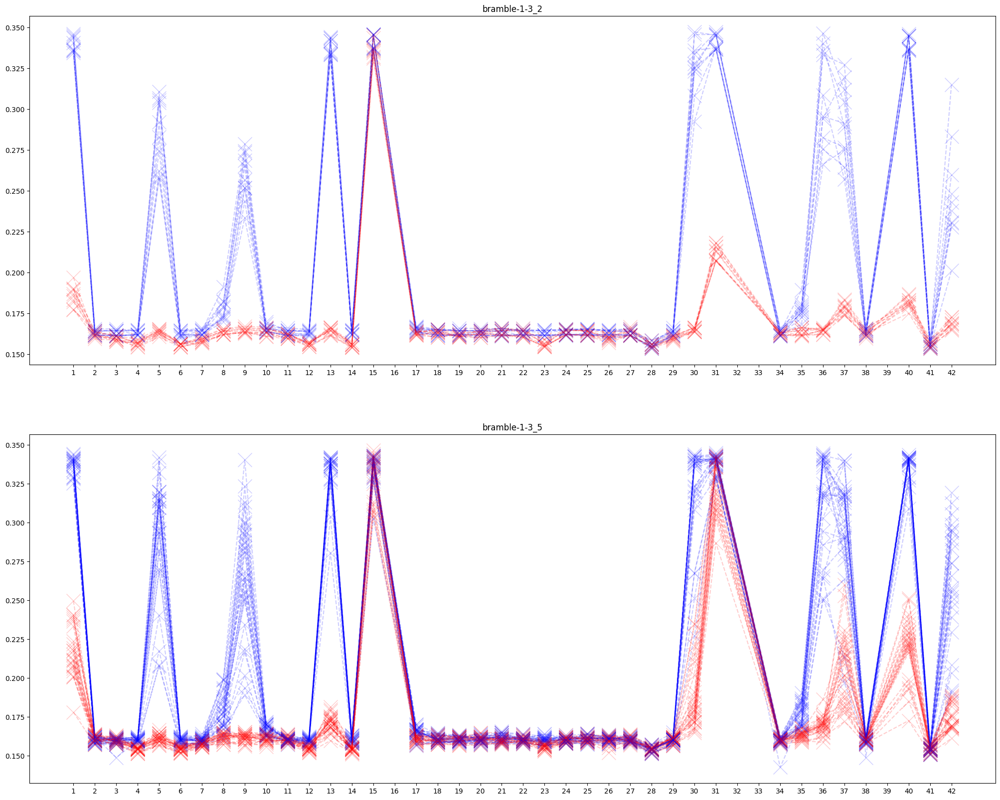

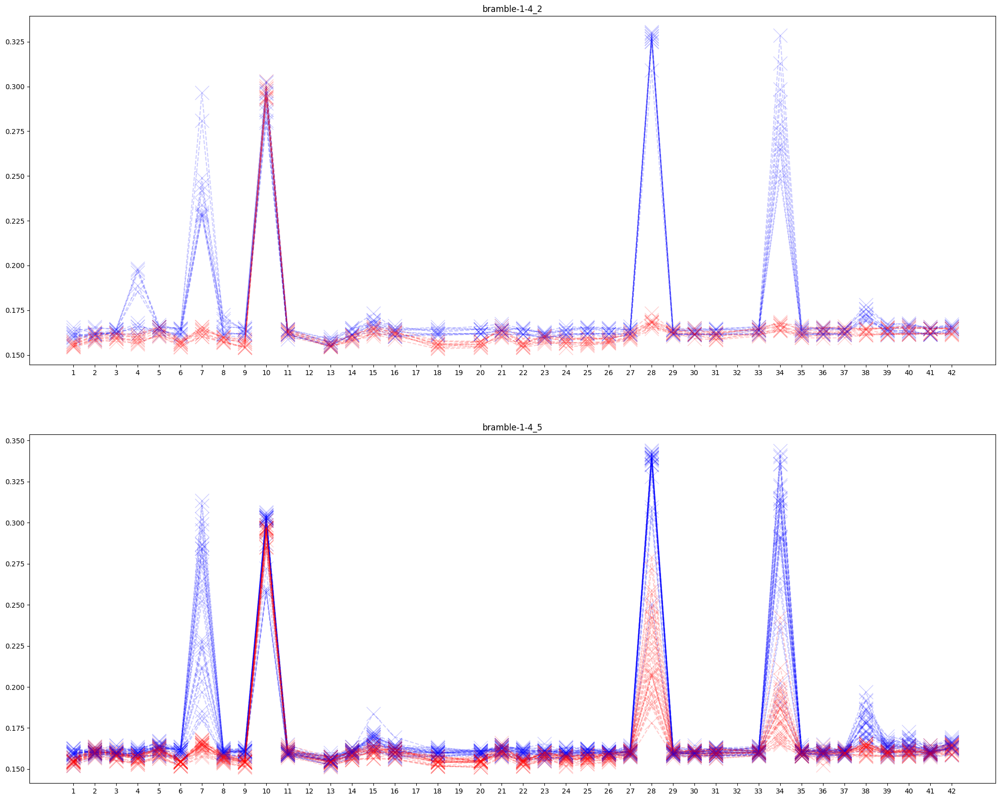

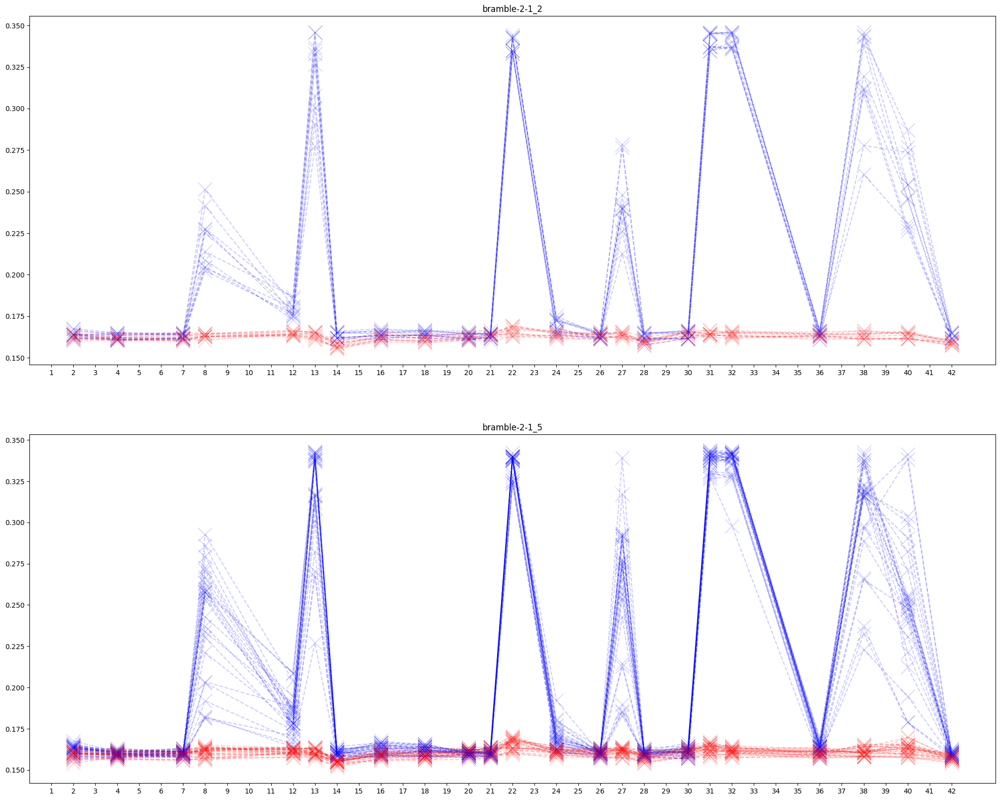

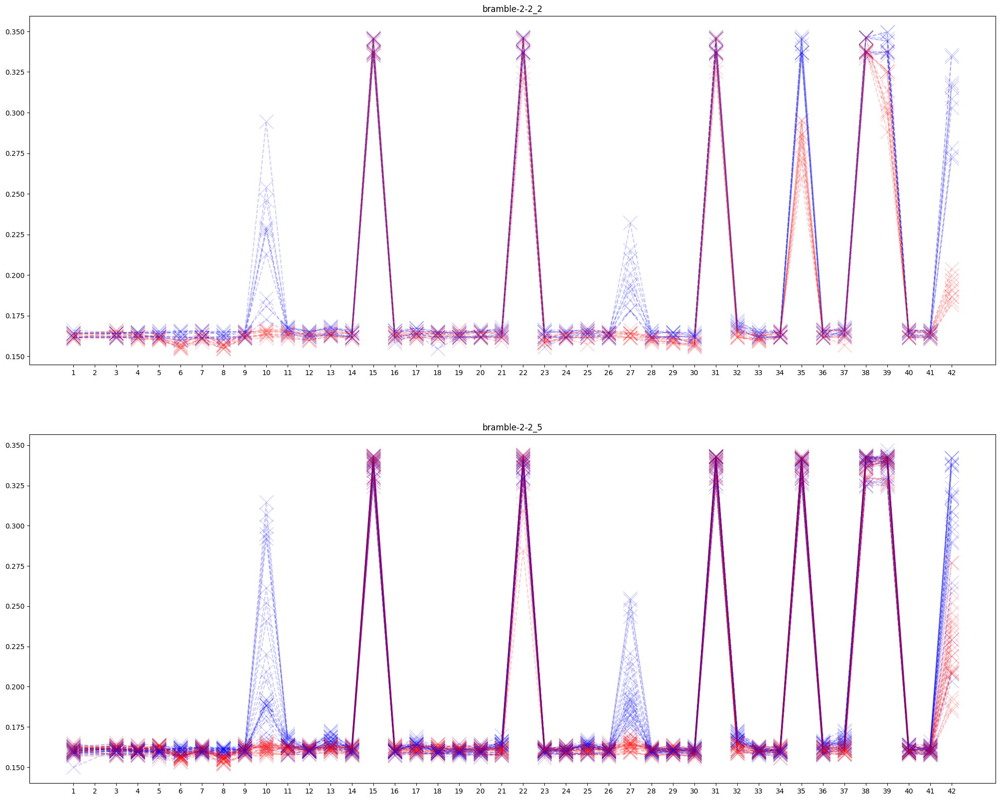

...

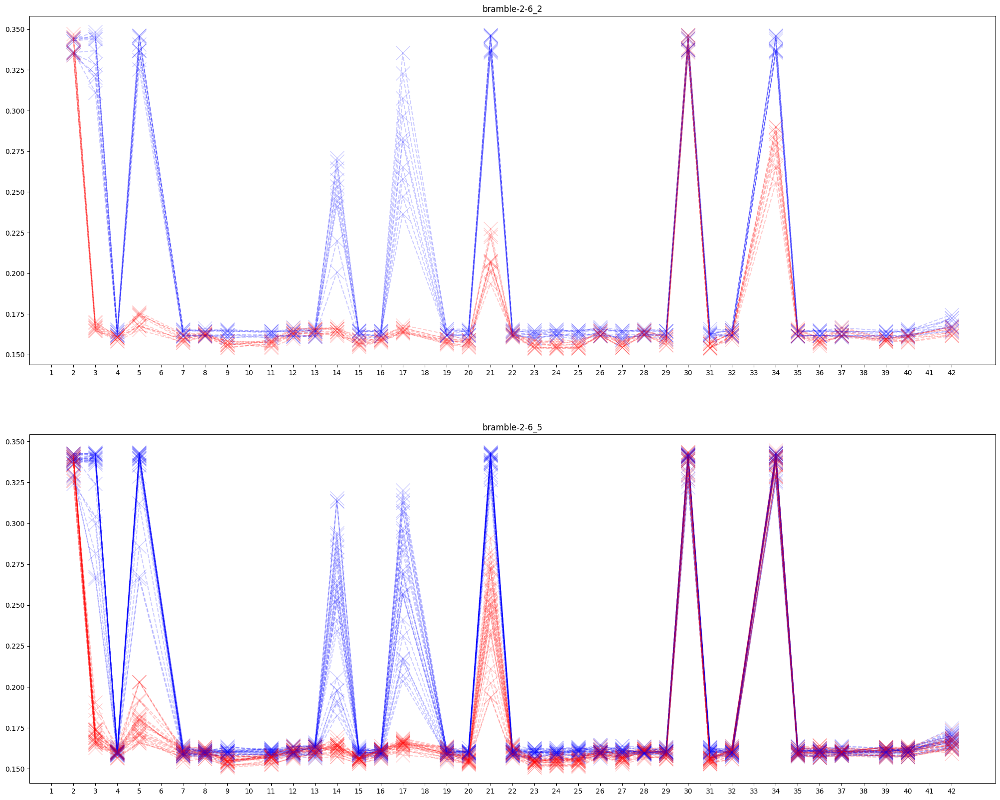

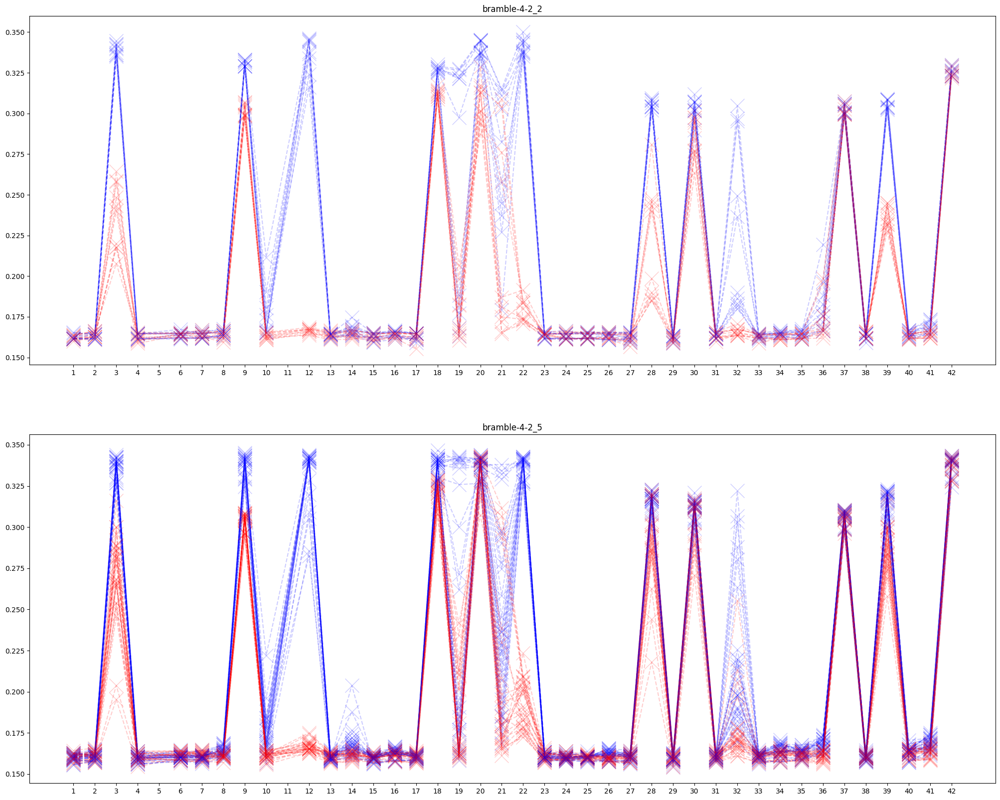

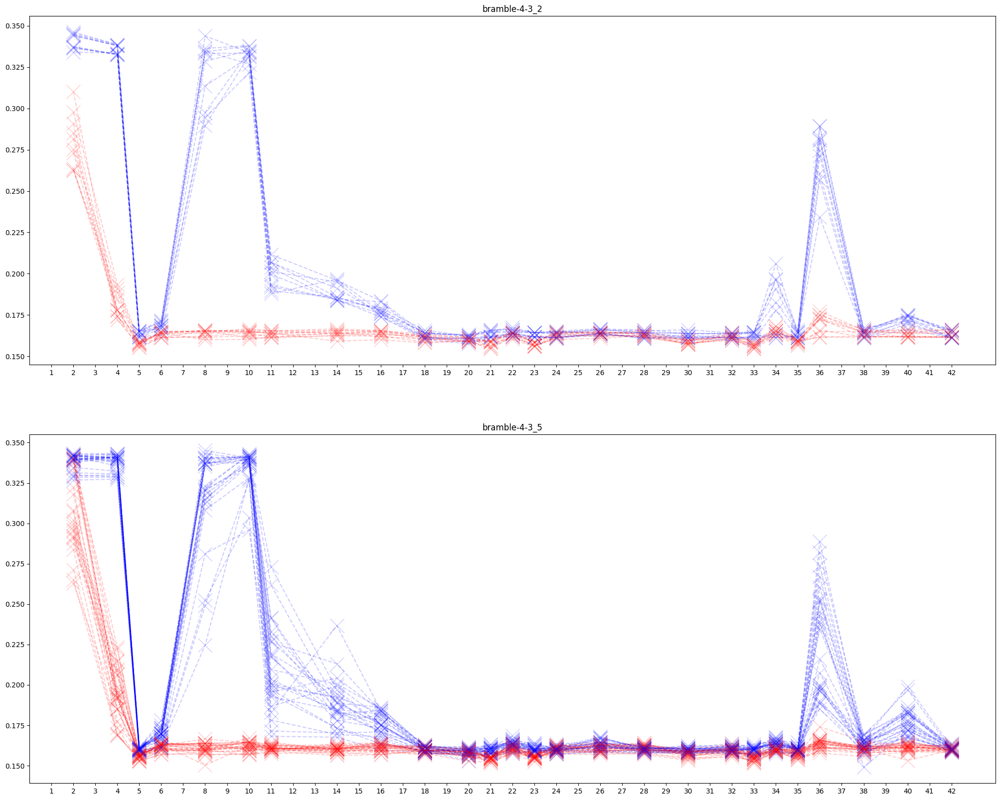

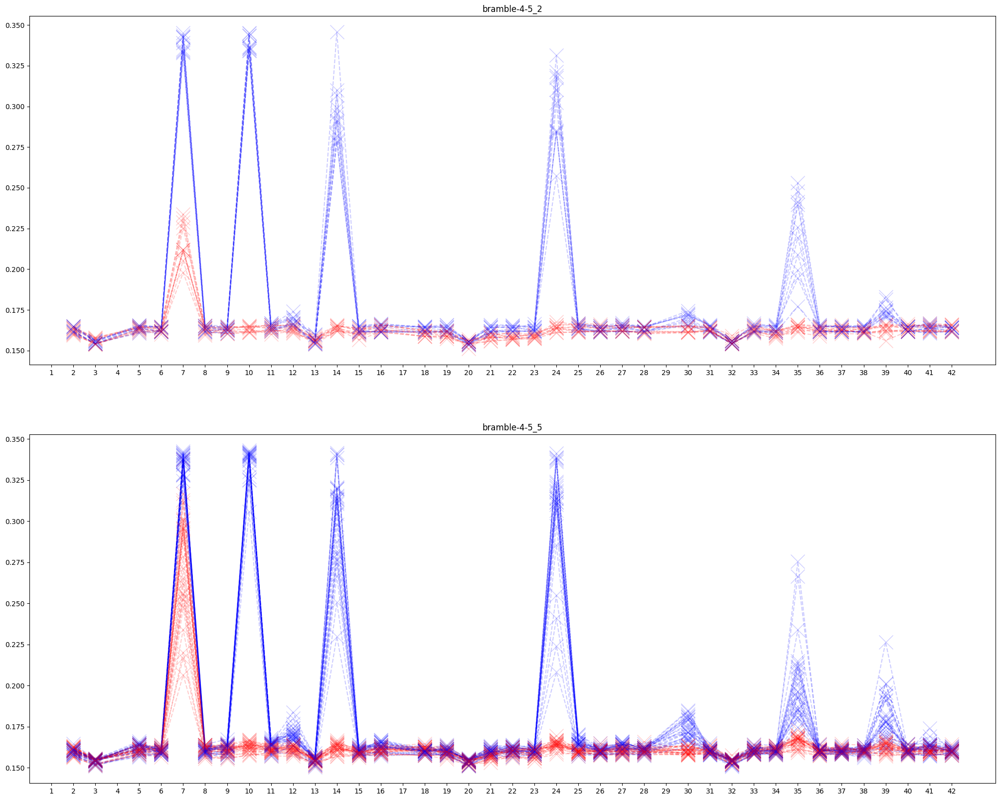

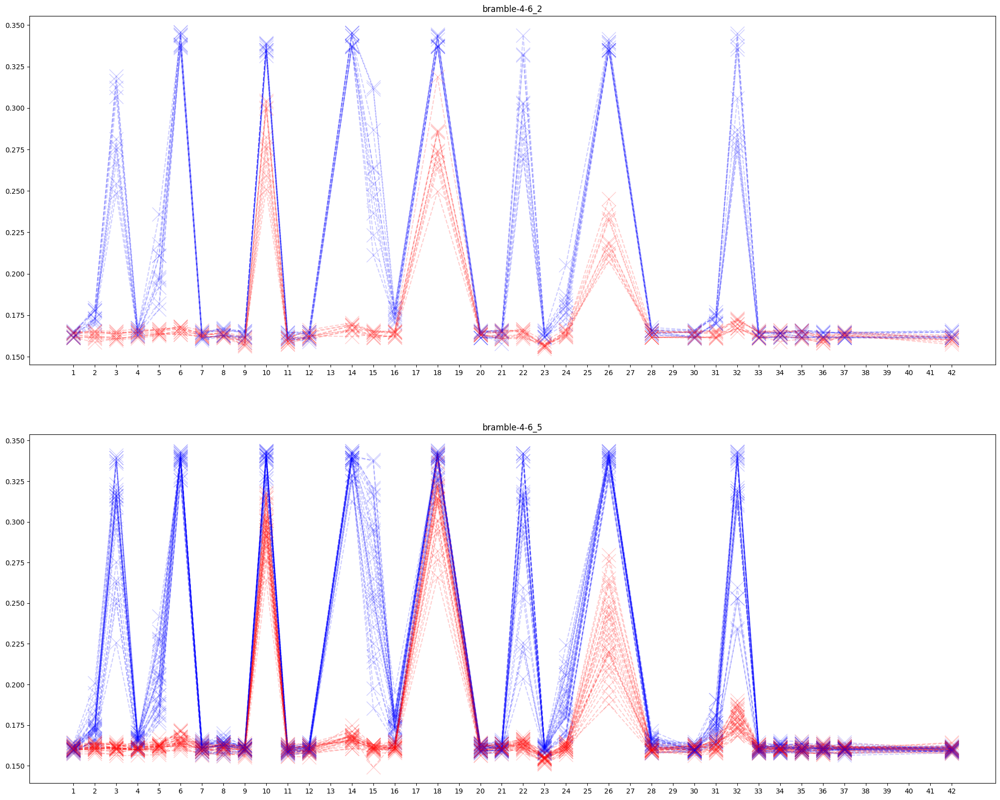

In [26]:
# bramble-1-1 39
# bramble-1-3 38
# bramble-1-4 39
# bramble-2-1 23
# bramble-2-2 41
# bramble-2-4 39
# bramble-2-5 38
# bramble-2-6 35
# bramble-4-1 36
# bramble-4-2 0
# bramble-4-3 26
# bramble-4-5 38
# bramble-4-6 32

subclusters=[
    "bramble-1-1","bramble-1-3","bramble-1-4","bramble-2-1",
    "bramble-2-2","bramble-2-4","bramble-2-5","bramble-2-6",
    "bramble-4-2","bramble-4-3","bramble-4-5", "bramble-4-6",
    ]
fixed_iters=10
peak_rate=4.8 #gflop/s

for p in subclusters:
    parent_dir = Path(f"/Users/animeshnd/model_splitting/logs/subcluster_exploration/{p}/")
    # fig, axs = plt.subplots(figsize=(25,10))
    for file_path in parent_dir.iterdir():
        # if file_path.is_dir() and "onnx" in str(file_path) and "onnx_inter" not in str(file_path):
        # if file_path.is_dir() and "onnx_inter" in str(file_path):
        # print(file_path)
        if file_path.is_dir() and "onnx" in str(file_path):
            model_id = str(file_path).split("/")[-1].split("_")[0]
            model_split = str(file_path).split("/")[-1].split("_")[1]
            # print(file_path)
            # if model_id!="vit":
            #     continue
            if model_id!="tcn":
                continue
            # print(model_id)
            # print(model_id)
            # if model_id!="resnet18":
            #     continue
            # print()
            fig, axs = plt.subplots(2, figsize=(25,20))
            dev_map={}
            for repeat in range(1,6):
                if repeat not in dev_map:
                    dev_map[repeat]={}
                for time_slice_dir in file_path.iterdir():
                    # print(str(time_slice_dir).split("/")[-1])
                    time_slice = str(time_slice_dir).split("/")[-1]
                    if time_slice not in dev_map[repeat]:
                        dev_map[repeat][time_slice] = {2:{}, 5:{}}
                        full_dir_path = Path(f"{time_slice_dir}/{repeat}/")
                        for f in full_dir_path.iterdir():
                            f=str(f)
                            dev_id = int(f.split("-")[-1].split("_")[0])
                            # print(dev_id)
                            world, rank =f.split("_")[-2:]
                            world = int(world)
                            rank = int(rank.split(".")[0])
                            try:
                                core_times, s_dt, e_dt = time_reader(f, core=4)
                            except Exception as e:
                                print(e)
                                print(f)
                                continue                        
                            if rank not in dev_map[repeat][time_slice][world]:
                                dev_map[repeat][time_slice][world][rank]={}
                            
                            dev_map[repeat][time_slice][world][rank][dev_id] = max(core_times)
            
            for repeat in dev_map:
                for w_ind, world in enumerate([2,5]):
                    flop = open(f"../aot_splitter/{model_id}_{model_split}_{world}_1_custom/flop.dict")
                    flop = ast.literal_eval(flop.readlines()[0].strip())
                    # print(flops)
                    for rank in range(world):
                        data = dev_map[repeat]["per_dev"][world][rank]
                        x = sorted(list(data.keys()))
                        y = [ (flop[rank]*10**-9)/data[i] for i in x]
                        # y = [ data[i] for i in x]
                        axs[w_ind].plot(x,y, color="blue", linestyle="--", markersize=20, marker="x", alpha=0.2)
                        
                        data = dev_map[repeat]["all_dev"][world][rank]
                        x = sorted(list(data.keys()))
                        y = [(flop[rank]*10**-9)/data[i] for i in x]
                        # y = [ data[i] for i in x]
                        axs[w_ind].plot(x,y, color="red", linestyle="--", markersize=20, marker="x", alpha=0.2)
                    axs[w_ind].set_xticks(np.arange(1,43,1))
                    axs[w_ind].set_title(f"{p}_{world}")
                    


                    # dev_map[time_slice][repeat][world] = {k:v for k,v in sorted(dev_map[time_slice][repeat][world].items(), key=lambda x: x[0])}
                    # dev_map = {k:v for k,v in sorted(dev_map.items(), key=lambda x: x[0])}

            # print(dev_map)

            # for 
            # break
        # break
    # break


            #read flop dict for model
            
            # for world in [2,5]:
            #     real_time = []
            #     max_real_time = 0
            #     fake_time=0
            #     for col in dev_map:
            #         flop_dict_file = open(Path(f"../aot_splitter/{model_id}_{model_split}_{world}_1_custom/flop.dict"))
            #         flop_dict = ast.literal_eval(flop_dict_file.readlines()[0].strip())
            #         stage_dict_file = open(Path(f"../aot_splitter/{model_id}_{model_split}_{world}_1_custom/stages.dict"))
            #         pair_wise_real_times=[]
            #         # pair_wise_fake_times=[]
            #         for r_ind, r in enumerate(dev_map[col][world]):
            #             pair_wise_real_times.append([])
            #             for v in dev_map[col][world][r]:
            #                 pair_wise_real_times[r_ind].append(v)
            #         # print(pair_wise_real_times)
            #         if len(pair_wise_real_times)==0:
            #             continue
            #         real_time.append(pair_wise_real_times)
            #         # print( max([ max(dev_map[col][world][r]) for r in dev_map[col][world]]))
            #         max_real_time+=max([ np.max(dev_map[col][world][r]) for r in dev_map[col][world]])
            #         fp = sorted([flop_dict[r] for r in dev_map[col][world]])
            #         peak_times = [f*fixed_iters*10**-9/peak_rate for f in fp]
            #         fake_time+=max(time_predictor(peak_times, fp))
            #     print(world, fake_time, max_real_time)




In [ ]:
# bramble-1-1 39
# bramble-1-3 38
# bramble-1-4 39
# bramble-2-1 23
# bramble-2-2 41
# bramble-2-4 39
# bramble-2-5 38
# bramble-2-6 35
# bramble-4-1 36
# bramble-4-2 0
# bramble-4-3 26
# bramble-4-5 38
# bramble-4-6 32

subclusters=[
    "bramble-1-1","bramble-1-3","bramble-1-4","bramble-2-1",
    "bramble-2-2","bramble-2-4","bramble-2-5","bramble-2-6",
    "bramble-4-2","bramble-4-3","bramble-4-5", "bramble-4-6",
    ]
fixed_iters=10
peak_rate=4.8 #gflop/s

for p in subclusters:
    parent_dir = Path(f"/Users/animeshnd/model_splitting/logs/subcluster_exploration/{p}/")
    # fig, axs = plt.subplots(figsize=(25,10))
    for file_path in parent_dir.iterdir():
        # if file_path.is_dir() and "onnx" in str(file_path) and "onnx_inter" not in str(file_path):
        # if file_path.is_dir() and "onnx_inter" in str(file_path):
        # print(file_path)
        if file_path.is_dir() and "onnx" in str(file_path):
            model_id = str(file_path).split("/")[-1].split("_")[0]
            model_split = str(file_path).split("/")[-1].split("_")[1]
            # print(file_path)
            if model_id!="vit":
                continue
            # if model_id!="tcn":
            #     continue
            # print(model_id)
            # print(model_id)
            # if model_id!="resnet18":
            #     continue
            # print()
            fig, axs = plt.subplots(2, figsize=(25,20))
            dev_map={}
            for repeat in range(1,6):
                if repeat not in dev_map:
                    dev_map[repeat]={}
                for time_slice_dir in file_path.iterdir():
                    # print(str(time_slice_dir).split("/")[-1])
                    time_slice = str(time_slice_dir).split("/")[-1]
                    if time_slice not in dev_map[repeat]:
                        dev_map[repeat][time_slice] = {2:{}, 5:{}}
                        full_dir_path = Path(f"{time_slice_dir}/{repeat}/")
                        for f in full_dir_path.iterdir():
                            f=str(f)
                            dev_id = int(f.split("-")[-1].split("_")[0])
                            # print(dev_id)
                            world, rank =f.split("_")[-2:]
                            world = int(world)
                            rank = int(rank.split(".")[0])
                            try:
                                core_times, s_dt, e_dt = time_reader(f, core=4)
                            except Exception as e:
                                print(f)
                                continue                        
                            if rank not in dev_map[repeat][time_slice][world]:
                                dev_map[repeat][time_slice][world][rank]={}
                            
                            dev_map[repeat][time_slice][world][rank][dev_id] = max(core_times)
            
            for repeat in dev_map:
                for w_ind, world in enumerate([2,5]):
                    flop = open(f"../aot_splitter/{model_id}_{model_split}_{world}_1_custom/flop.dict")
                    flop = ast.literal_eval(flop.readlines()[0].strip())
                    # print(flops)
                    for rank in range(world):
                        data = dev_map[repeat]["per_dev"][world][rank]
                        x = sorted(list(data.keys()))
                        y = [ (flop[rank]*10**-9)/data[i] for i in x]
                        # y = [ data[i] for i in x]
                        axs[w_ind].plot(x,y, color="blue", linestyle="--", markersize=20, marker="x", alpha=0.2)
                        
                        data = dev_map[repeat]["all_dev"][world][rank]
                        x = sorted(list(data.keys()))
                        y = [(flop[rank]*10**-9)/data[i] for i in x]
                        # y = [ data[i] for i in x]
                        axs[w_ind].plot(x,y, color="red", linestyle="--", markersize=20, marker="x", alpha=0.2)
                    axs[w_ind].set_xticks(np.arange(1,43,1))
                    axs[w_ind].set_title(f"{p}_{world}")
                    


                    # dev_map[time_slice][repeat][world] = {k:v for k,v in sorted(dev_map[time_slice][repeat][world].items(), key=lambda x: x[0])}
                    # dev_map = {k:v for k,v in sorted(dev_map.items(), key=lambda x: x[0])}

            # print(dev_map)

            # for 
            # break
        # break
    # break


            #read flop dict for model
            
            # for world in [2,5]:
            #     real_time = []
            #     max_real_time = 0
            #     fake_time=0
            #     for col in dev_map:
            #         flop_dict_file = open(Path(f"../aot_splitter/{model_id}_{model_split}_{world}_1_custom/flop.dict"))
            #         flop_dict = ast.literal_eval(flop_dict_file.readlines()[0].strip())
            #         stage_dict_file = open(Path(f"../aot_splitter/{model_id}_{model_split}_{world}_1_custom/stages.dict"))
            #         pair_wise_real_times=[]
            #         # pair_wise_fake_times=[]
            #         for r_ind, r in enumerate(dev_map[col][world]):
            #             pair_wise_real_times.append([])
            #             for v in dev_map[col][world][r]:
            #                 pair_wise_real_times[r_ind].append(v)
            #         # print(pair_wise_real_times)
            #         if len(pair_wise_real_times)==0:
            #             continue
            #         real_time.append(pair_wise_real_times)
            #         # print( max([ max(dev_map[col][world][r]) for r in dev_map[col][world]]))
            #         max_real_time+=max([ np.max(dev_map[col][world][r]) for r in dev_map[col][world]])
            #         fp = sorted([flop_dict[r] for r in dev_map[col][world]])
            #         peak_times = [f*fixed_iters*10**-9/peak_rate for f in fp]
            #         fake_time+=max(time_predictor(peak_times, fp))
            #     print(world, fake_time, max_real_time)




/Users/animeshnd/model_splitting/logs/subcluster_exploration/bramble-4-5/resnet18_children_onnx/all_dev/1/speed_chronosbramble-4-5-17_5_4.log
/Users/animeshnd/model_splitting/logs/subcluster_exploration/bramble-4-5/resnet18_children_onnx/all_dev/1/speed_chronosbramble-4-5-17_5_1.log
/Users/animeshnd/model_splitting/logs/subcluster_exploration/bramble-4-5/resnet18_children_onnx/all_dev/1/speed_chronosbramble-4-5-17_5_0.log
/Users/animeshnd/model_splitting/logs/subcluster_exploration/bramble-4-5/resnet18_children_onnx/all_dev/1/speed_chronosbramble-4-5-17_5_2.log
/Users/animeshnd/model_splitting/logs/subcluster_exploration/bramble-4-5/resnet18_children_onnx/all_dev/1/speed_chronosbramble-4-5-17_5_3.log
/Users/animeshnd/model_splitting/logs/subcluster_exploration/bramble-4-5/resnet18_children_onnx/all_dev/1/speed_chronosbramble-4-5-17_2_1.log
/Users/animeshnd/model_splitting/logs/subcluster_exploration/bramble-4-5/resnet18_children_onnx/all_dev/1/speed_chronosbramble-4-5-17_2_0.log
/Users

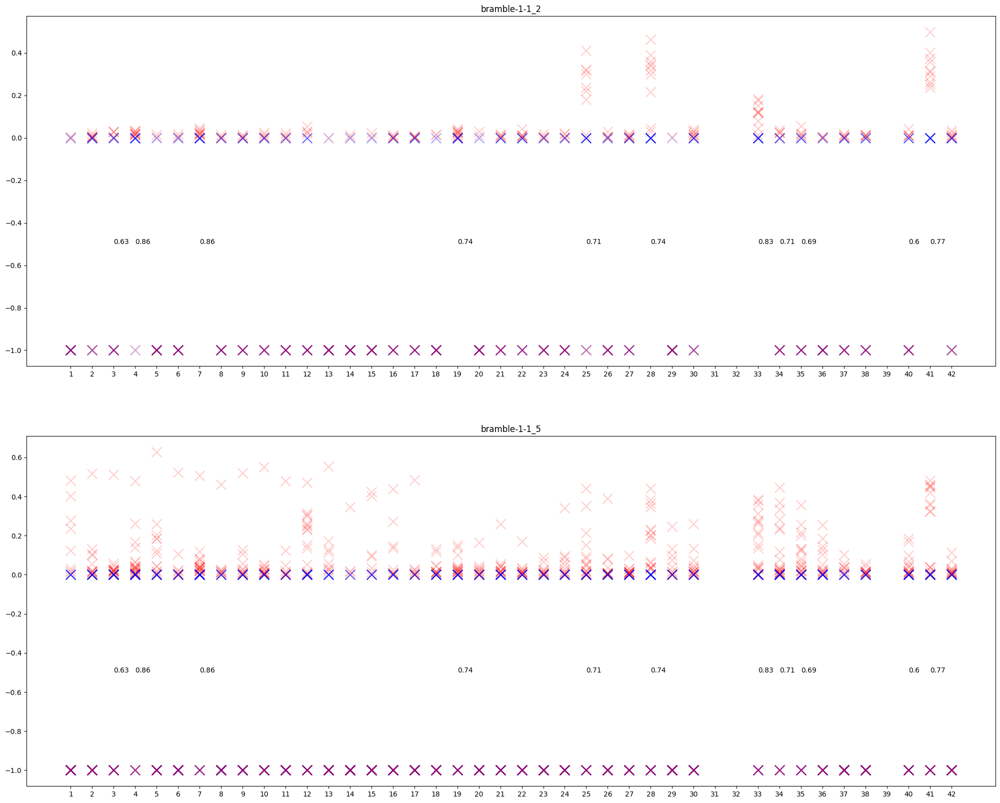

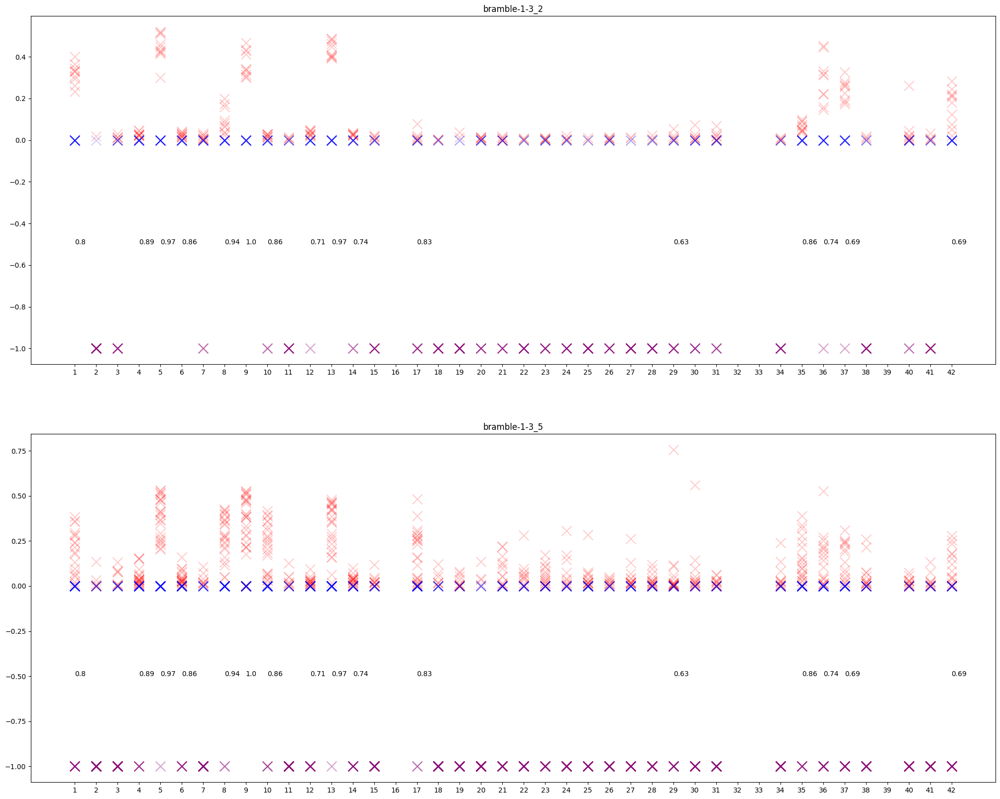

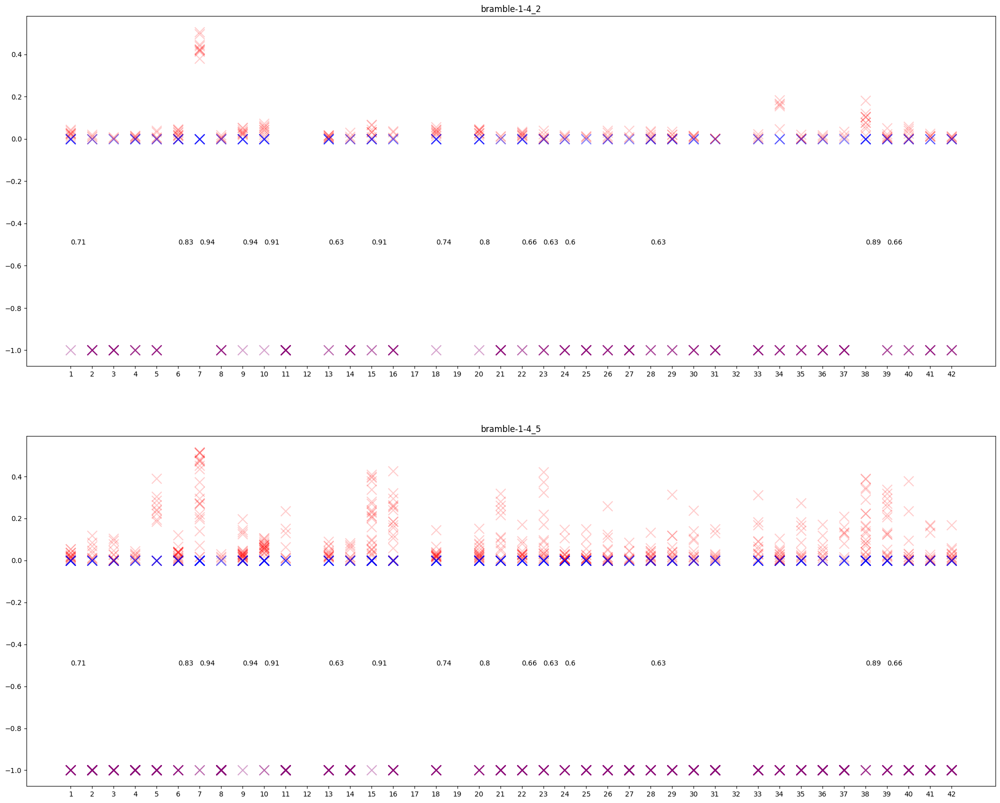

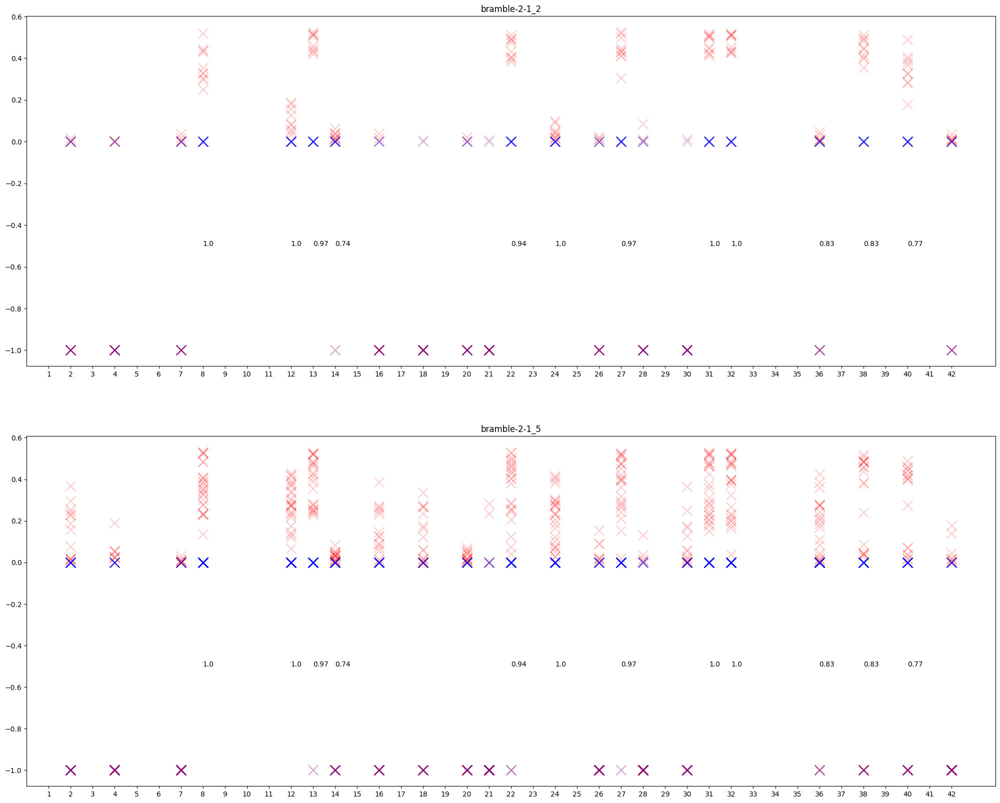

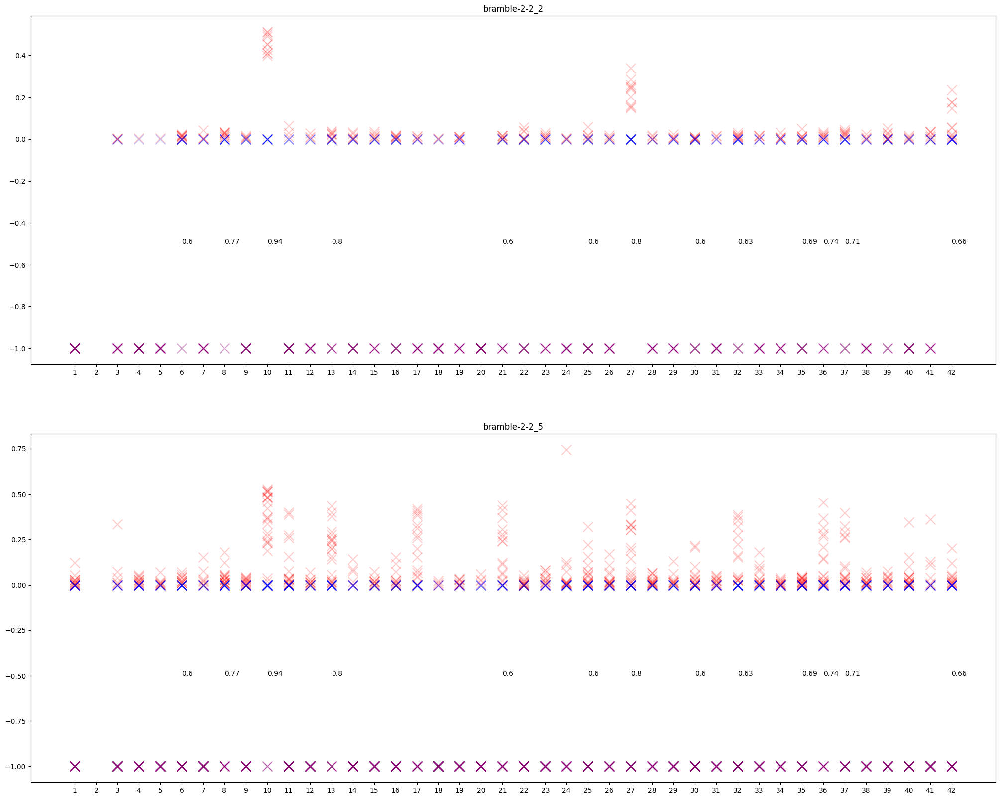

...

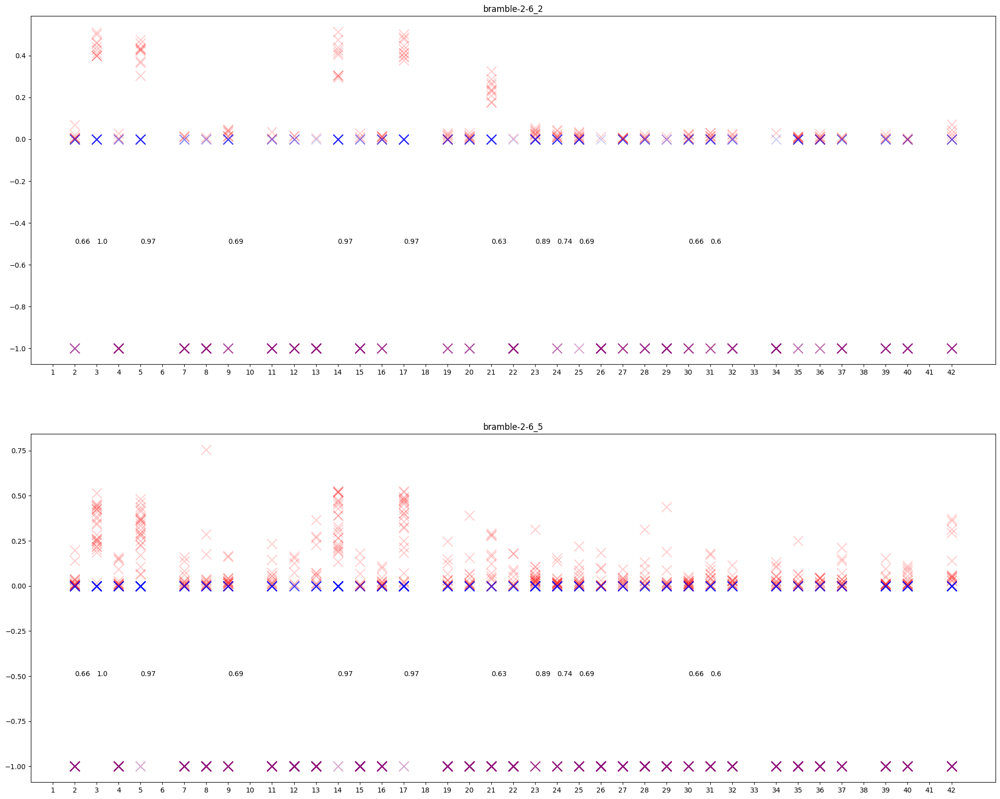

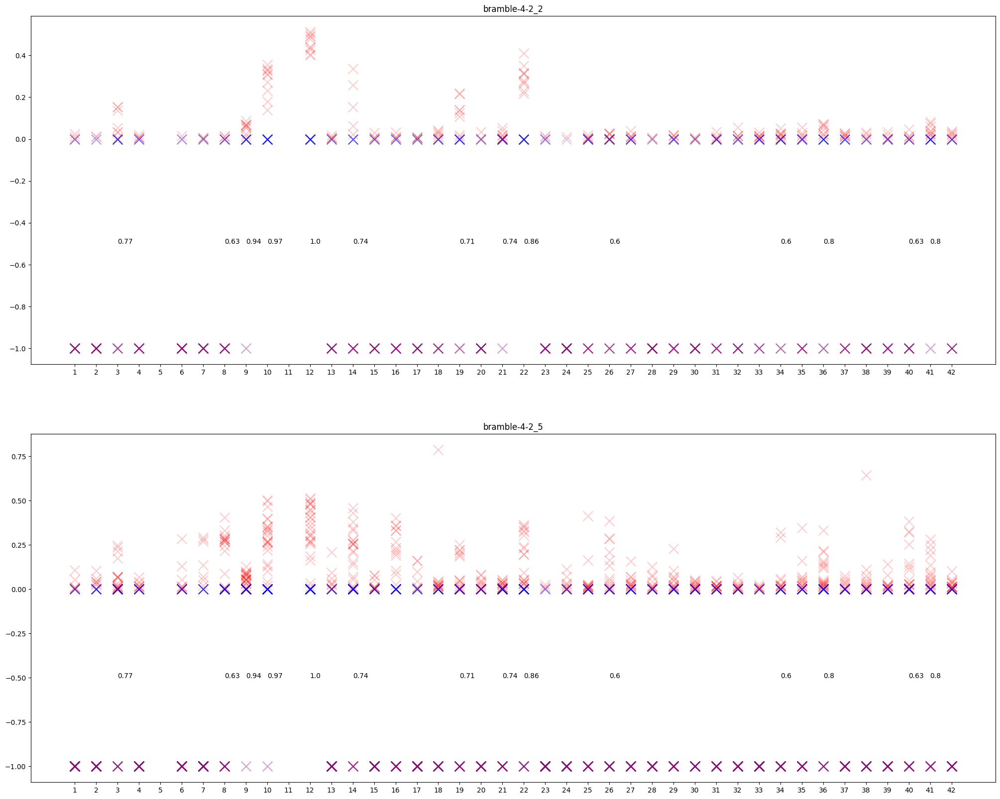

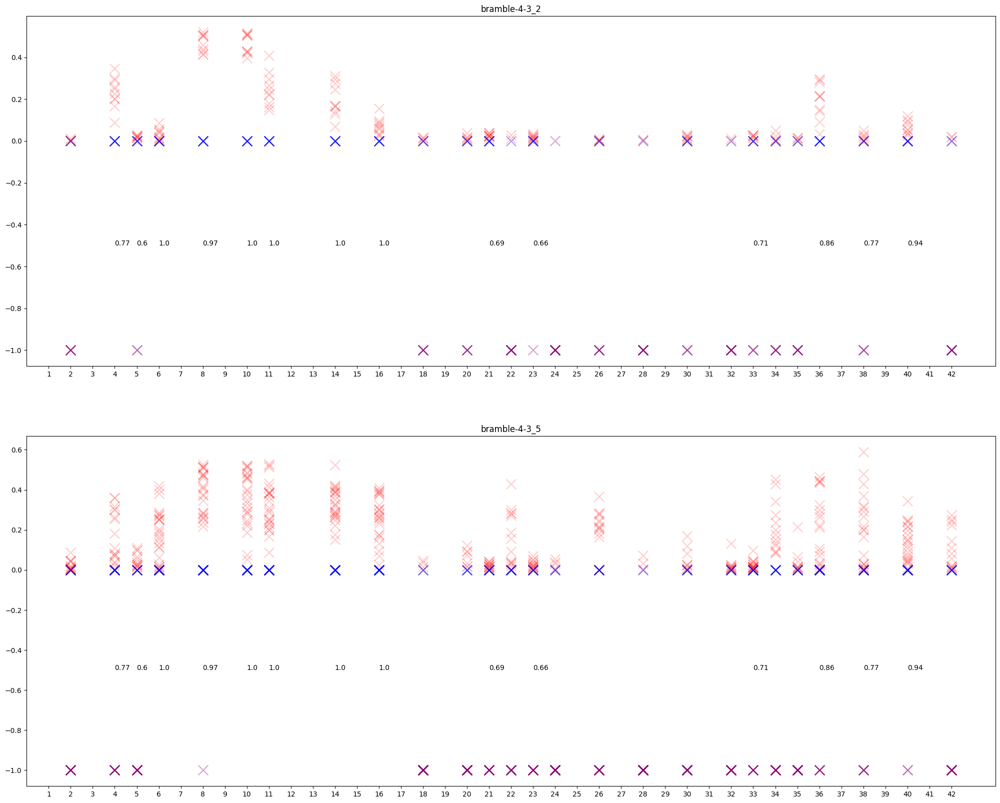

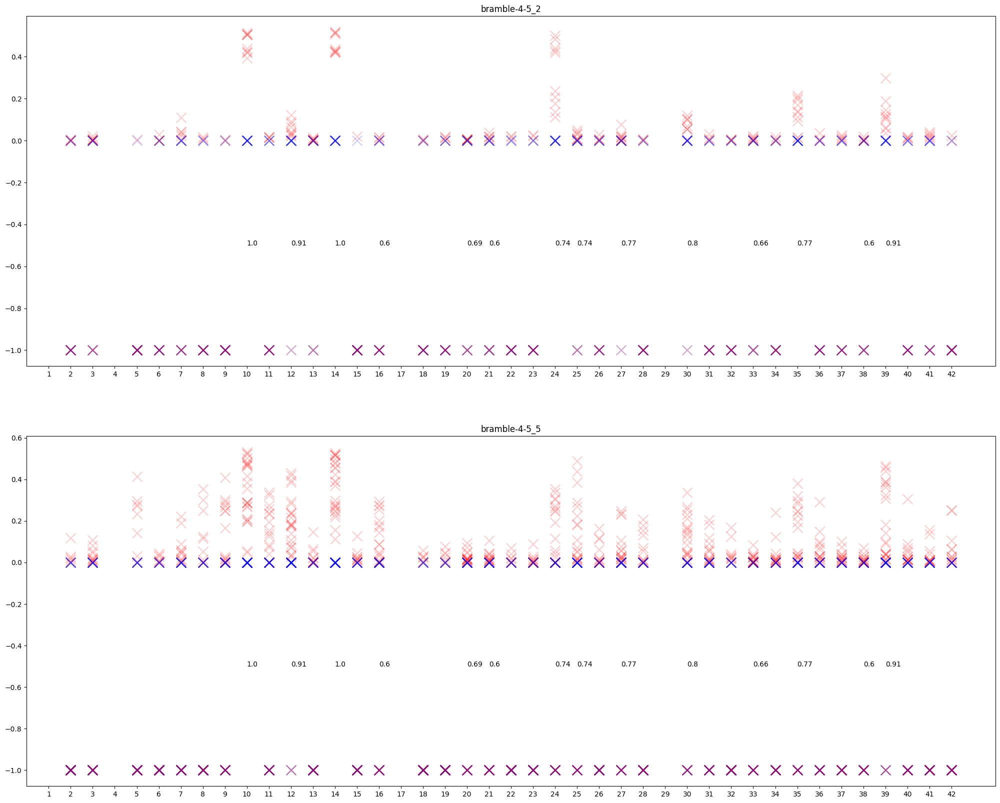

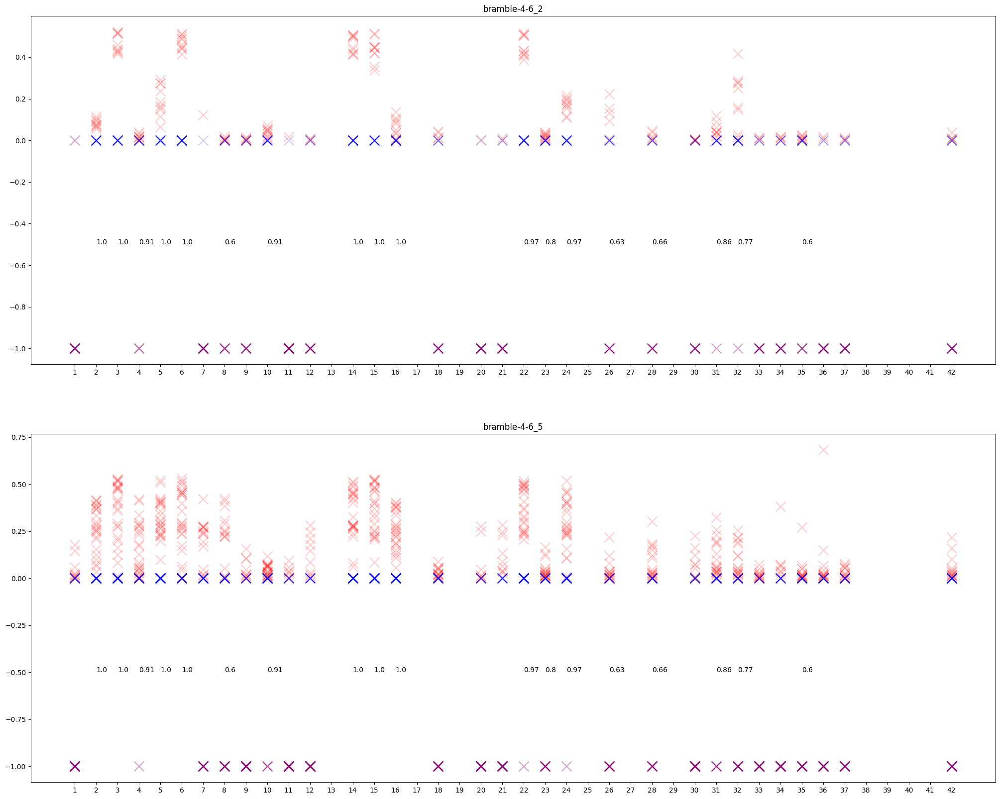

In [48]:
# bramble-1-1 39
# bramble-1-3 38
# bramble-1-4 39
# bramble-2-1 23
# bramble-2-2 41
# bramble-2-4 39
# bramble-2-5 38
# bramble-2-6 35
# bramble-4-1 36
# bramble-4-2 0
# bramble-4-3 26
# bramble-4-5 38
# bramble-4-6 32

subclusters=[
    "bramble-1-1","bramble-1-3","bramble-1-4","bramble-2-1",
    "bramble-2-2","bramble-2-4","bramble-2-5","bramble-2-6",
    "bramble-4-2","bramble-4-3","bramble-4-5", "bramble-4-6",
    ]
fixed_iters=10
peak_rate=4.8 #gflop/s

for p in subclusters:
    parent_dir = Path(f"/Users/animeshnd/model_splitting/logs/subcluster_exploration/{p}/")
    # fig, axs = plt.subplots(figsize=(25,10))
    for file_path in parent_dir.iterdir():
        # if file_path.is_dir() and "onnx" in str(file_path) and "onnx_inter" not in str(file_path):
        # if file_path.is_dir() and "onnx_inter" in str(file_path):
        # print(file_path)
        if file_path.is_dir() and "onnx" in str(file_path):
            model_id = str(file_path).split("/")[-1].split("_")[0]
            model_split = str(file_path).split("/")[-1].split("_")[1]
            # print(file_path)
            # if model_id!="vit":
            #     continue
            # if model_id!="tcn":
            #     continue
            # print(model_id)
            # print(model_id)
            if model_id!="resnet18":
                continue
            # print()
            fig, axs = plt.subplots(2, figsize=(25,20))
            dev_map={}
            for repeat in range(1,6):
                if repeat not in dev_map:
                    dev_map[repeat]={}
                for time_slice_dir in file_path.iterdir():
                    # print(str(time_slice_dir).split("/")[-1])
                    time_slice = str(time_slice_dir).split("/")[-1]
                    if time_slice not in dev_map[repeat]:
                        dev_map[repeat][time_slice] = {2:{}, 5:{}}
                        full_dir_path = Path(f"{time_slice_dir}/{repeat}/")
                        for f in full_dir_path.iterdir():
                            f=str(f)
                            dev_id = int(f.split("-")[-1].split("_")[0])
                            # print(dev_id)
                            world, rank =f.split("_")[-2:]
                            world = int(world)
                            rank = int(rank.split(".")[0])
                            # if rank==3:
                            #     continue
                            try:
                                core_times, s_dt, e_dt = time_reader(f, core=4)
                            except Exception as e:
                                print(f)
                                continue                        
                            if rank not in dev_map[repeat][time_slice][world]:
                                dev_map[repeat][time_slice][world][rank]={}
                            
                            dev_map[repeat][time_slice][world][rank][dev_id] = max(core_times)
            
            freq_map={world: {k:-1 for k in range(1,43)} for world in [2,5]}
            total={world: 0 for world in [2,5]}
            for repeat in dev_map:
                for w_ind, world in enumerate([2,5]):
                    flop = open(f"../aot_splitter/{model_id}_{model_split}_{world}_1_custom/flop.dict")
                    flop = ast.literal_eval(flop.readlines()[0].strip())
                    # print(flops)
                    for rank in range(world):    
                        data = dev_map[repeat]["per_dev"][world][rank]
                        x = sorted(list(data.keys()))
                        # y = [ (flop[rank]*10**-9)/data[i] for i in x]
                        y = [ data[i] for i in x]
                        total[world]+=1
                        # if rank!=4:
                        #     y=[i/100 for i in y]
                        # y = [ data[i] for i in x]
                        # axs[w_ind].plot(x,y, color="blue", linestyle="--", markersize=20, marker="x", alpha=0.2)
                        
                        data = dev_map[repeat]["all_dev"][world][rank]
                        x = sorted(list(data.keys()))
                        # y = [(flop[rank]*10**-9)/data[i] for i in x]
                        diff_y = [ 1-(y[ind]/data[i]) for ind, i in enumerate(x)]
                        for ind in range(len(diff_y)):
                            if freq_map[world][x[ind]]==-1:
                                    freq_map[world][x[ind]]=0
                            if diff_y[ind] < 0:
                                y[ind]=-1
                                diff_y[ind]=-1
                            else:
                                freq_map[world][x[ind]]+=1
                                y[ind]=0
                        
                        # axs[w_ind].plot(x,y, color="blue", linestyle="--", markersize=20, marker="x", alpha=0.2)
                        axs[w_ind].scatter(x,y, color="blue", s=200, marker="x", alpha=0.2)

                        # if sum([1 for i in y if i<-0.2]) > 0:
                        #     continue
                        # y = [data[i] for i in x]
                        # if rank!=4:
                        #     y=[i/100 for i in y]
                        # y = [ data[i] for i in x]
                        # axs[w_ind].plot(x,diff_y, color="red", linestyle="--", markersize=20, marker="x", alpha=0.2)
                        axs[w_ind].scatter(x,diff_y, color="red", s=200, marker="x", alpha=0.2)
                    axs[w_ind].set_xticks(np.arange(1,43,1))
                    axs[w_ind].set_title(f"{p}_{world}")
            
            for w_ind, w in enumerate(freq_map.keys()):
                sub_arr = ''
                for x in freq_map[w]:
                    val = round(sum([freq_map[k][x] for k in freq_map.keys()])/sum([total[k] for k in freq_map.keys()]), 2)
                    if val  < 0.6:
                        continue
                    # axs[w_ind].text(x, -0.5, freq_map[w][x]/total[w])
                    axs[w_ind].text(x, -0.5, val  )
                    sub_arr+=f"{p}-{x}\n"
                f=open(f"{p}.model.imperf","w")
                f.write(sub_arr)
                f.close()

                    # dev_map[time_slice][repeat][world] = {k:v for k,v in sorted(dev_map[time_slice][repeat][world].items(), key=lambda x: x[0])}
                    # dev_map = {k:v for k,v in sorted(dev_map.items(), key=lambda x: x[0])}

            # print(dev_map)

            # for 
            # break
        # break
    # break


            #read flop dict for model
            
            # for world in [2,5]:
            #     real_time = []
            #     max_real_time = 0
            #     fake_time=0
            #     for col in dev_map:
            #         flop_dict_file = open(Path(f"../aot_splitter/{model_id}_{model_split}_{world}_1_custom/flop.dict"))
            #         flop_dict = ast.literal_eval(flop_dict_file.readlines()[0].strip())
            #         stage_dict_file = open(Path(f"../aot_splitter/{model_id}_{model_split}_{world}_1_custom/stages.dict"))
            #         pair_wise_real_times=[]
            #         # pair_wise_fake_times=[]
            #         for r_ind, r in enumerate(dev_map[col][world]):
            #             pair_wise_real_times.append([])
            #             for v in dev_map[col][world][r]:
            #                 pair_wise_real_times[r_ind].append(v)
            #         # print(pair_wise_real_times)
            #         if len(pair_wise_real_times)==0:
            #             continue
            #         real_time.append(pair_wise_real_times)
            #         # print( max([ max(dev_map[col][world][r]) for r in dev_map[col][world]]))
            #         max_real_time+=max([ np.max(dev_map[col][world][r]) for r in dev_map[col][world]])
            #         fp = sorted([flop_dict[r] for r in dev_map[col][world]])
            #         peak_times = [f*fixed_iters*10**-9/peak_rate for f in fp]
            #         fake_time+=max(time_predictor(peak_times, fp))
            #     print(world, fake_time, max_real_time)


